In [1]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None

In [2]:
df = pd.read_csv(r'C:\Users\Uche Chris\Documents\data analysis projects\corrolation\movies.csv')

In [3]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7663,More to Life,NaN,Drama,2020,"October 23, 2020 (United States)",3.1,18.0,Joseph Ebanks,Joseph Ebanks,Shannon Bond,United States,7000.0,NaN,NaN,90.0
7664,Dream Round,NaN,Comedy,2020,"February 7, 2020 (United States)",4.7,36.0,Dusty Dukatz,Lisa Huston,Michael Saquella,United States,NaN,NaN,Cactus Blue Entertainment,90.0
7665,Saving Mbango,NaN,Drama,2020,"April 27, 2020 (Cameroon)",5.7,29.0,Nkanya Nkwai,Lynno Lovert,Onyama Laura,United States,58750.0,NaN,Embi Productions,NaN
7666,It's Just Us,NaN,Drama,2020,"October 1, 2020 (United States)",NaN,NaN,James Randall,James Randall,Christina Roz,United States,15000.0,NaN,NaN,120.0


In [4]:
# We need to see if we have any missing data
# Let's loop through the data and see if there is anything missing

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, (pct_missing)))
##to round up the number
#print('{} - {}%'.format(col, round(pct_missing*100)))

name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


In [5]:
# Data Types for our columns

print(df.dtypes)

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object


In [6]:
#drp NA values from the columns with the highest amount of NA values
df.dropna(subset=['budget','gross','rating'],inplace=True)
df.shape

(5424, 15)

In [7]:
#replace NA values with the mode for the columns with little amount of NA values
def get_mode(feature,df):
    return df[feature].mode()[0]

for col in df:
    df[col].fillna(get_mode(col,df),inplace=True)

In [8]:
#check for duplicate rows
print("Duplicated rows: ", df.duplicated(keep=False).sum())


Duplicated rows:  0


In [9]:
#convert 'budget' & 'gross' column to integers
df['budget'] = df['budget'].astype('int64')
df['gross'] = df['gross'].astype('int64')

In [10]:
#convert the 'released' column to date time column
df['released'] = df['released'].apply(lambda x: x.split('(')[0])
df['released'] = pd.to_datetime(df['released'])

# get month, day, and day of the week from released
df['month'] = df['released'].dt.month
df['day'] = df['released'].dt.day
df['week_day'] = df['released'].dt.dayofweek


In [11]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,month,day,week_day
0,The Shining,R,Drama,1980,1980-06-13,8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,6,13,4
1,The Blue Lagoon,R,Adventure,1980,1980-07-02,5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,7,2,2
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,1980-06-20,8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,6,20,4
3,Airplane!,PG,Comedy,1980,1980-07-02,7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,7,2,2
4,Caddyshack,R,Comedy,1980,1980-07-25,7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,7,25,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,R,Action,2020,2020-01-17,6.6,140000.0,Adil El Arbi,Peter Craig,Will Smith,United States,90000000,426505244,Columbia Pictures,124.0,1,17,4
7649,Sonic the Hedgehog,PG,Action,2020,2020-02-14,6.5,102000.0,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000,319715683,Paramount Pictures,99.0,2,14,4
7650,Dolittle,PG,Adventure,2020,2020-01-17,5.6,53000.0,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000,245487753,Universal Pictures,101.0,1,17,4
7651,The Call of the Wild,PG,Adventure,2020,2020-02-21,6.8,42000.0,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000,111105497,20th Century Studios,100.0,2,21,4


In [12]:
#Top 5 movies with biggest budget:
df.sort_values(by = 'budget',inplace=False, ascending=False).head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,month,day,week_day
7445,Avengers: Endgame,PG-13,Action,2019,2019-04-26,8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,4,26,4
7244,Avengers: Infinity War,PG-13,Action,2018,2018-04-27,8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,4,27,4
7075,Star Wars: Episode VIII - The Last Jedi,PG-13,Action,2017,2017-12-15,7.0,581000.0,Rian Johnson,Rian Johnson,Daisy Ridley,United States,317000000,1332698830,Walt Disney Pictures,152.0,12,15,4
7066,Justice League,PG-13,Action,2017,2017-11-17,6.1,418000.0,Zack Snyder,Jerry Siegel,Ben Affleck,United States,300000000,657926987,Warner Bros.,120.0,11,17,4
5060,Pirates of the Caribbean: at World's End,PG-13,Action,2007,2007-05-25,7.1,608000.0,Gore Verbinski,Ted Elliott,Johnny Depp,United States,300000000,960996492,Walt Disney Pictures,169.0,5,25,4


In [13]:
#Top 5 highest grossing movies:
df.sort_values(by = 'gross',inplace=False, ascending=False).head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,month,day,week_day
5445,Avatar,PG-13,Action,2009,2009-12-18,7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,12,18,4
7445,Avengers: Endgame,PG-13,Action,2019,2019-04-26,8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,4,26,4
3045,Titanic,PG-13,Drama,1997,1997-12-19,7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,12,19,4
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,2015-12-18,7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,12,18,4
7244,Avengers: Infinity War,PG-13,Action,2018,2018-04-27,8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,4,27,4


In [14]:
#Top 5 most profitable movies:
#here i create a new column by subtracting 'budget' from 'gross' to get the 'revenue'

df['revenue']=df.apply(lambda x: x['gross'] - x['budget'], axis=1)
df.sort_values(by='revenue',ascending=False).head()

#the most highest grossing genre is 'Action'

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,month,day,week_day,revenue
5445,Avatar,PG-13,Action,2009,2009-12-18,7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,12,18,4,2610246203
7445,Avengers: Endgame,PG-13,Action,2019,2019-04-26,8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,4,26,4,2441501328
3045,Titanic,PG-13,Drama,1997,1997-12-19,7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,12,19,4,2001647264
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,2015-12-18,7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,12,18,4,1824521700
7244,Avengers: Infinity War,PG-13,Action,2018,2018-04-27,8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,4,27,4,1727359754


# Visualisations

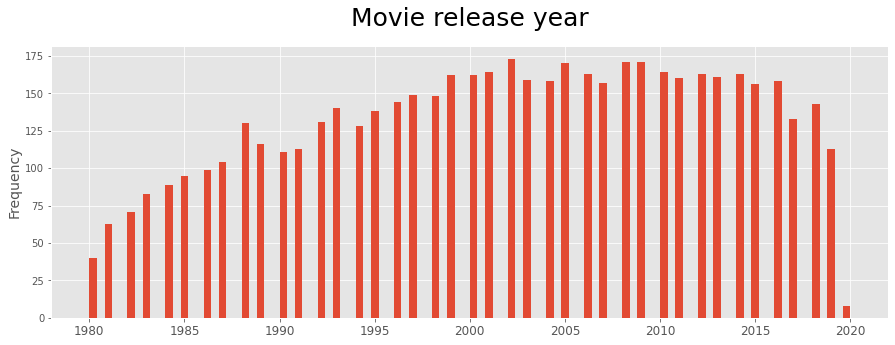

In [15]:
#Number of movies realeased each year from 1980-2020
plt.xticks(fontsize=12)
plt.ylabel("Frequency", fontsize=14)
plt.title("Movie release year", fontsize=25, pad=20)
df["year"].plot.hist(figsize=(15,5), bins=100);

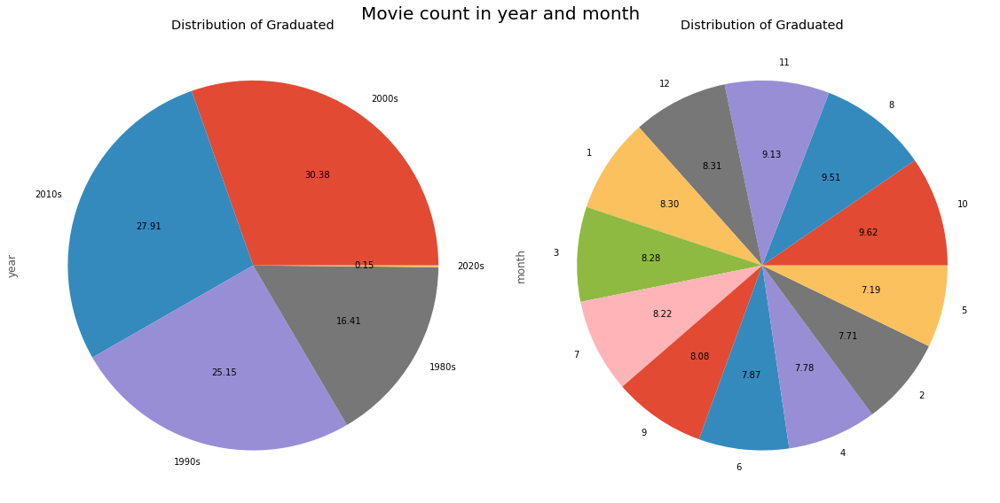

In [16]:
#piechart showing the % of movies released each month and decade
fig, ax  = plt.subplots(1,2,figsize = (16,8))
fig.suptitle('Movie count in year and month', fontsize=20)

movie_count_in_10th_year = df["year"].dropna().apply(lambda x:str(int(x)//10*10)+'s').value_counts()
movie_count_in_month = df["month"].value_counts()
    
movie_count_in_10th_year.plot.pie(title='Distribution of Graduated', ax=ax[0], autopct="%.2f")
movie_count_in_month.plot.pie(title='Distribution of Graduated', ax=ax[1], autopct="%.2f")
fig.tight_layout()

The 2010s had the most amount of movies released
more movies are realesed in the month of october than any other month

Text(0.5, 1.0, 'Revenue by Genre of Movies')

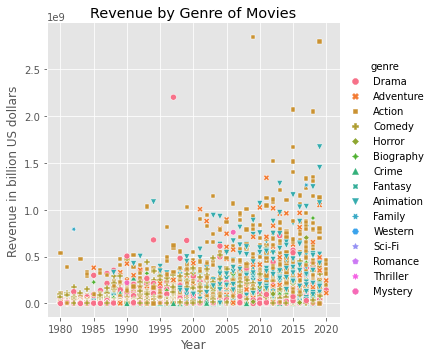

In [17]:
#scatterplot showing Revenue by Genre of Movies
sns.relplot(data=df,x='year',y='gross',hue='genre',style='genre')
plt.xlabel('Year')
plt.ylabel('Revenue in billion US dollars')
plt.title('Revenue by Genre of Movies')

In [18]:
# Top movie genres by number of movies released 
df_genre = df.groupby(by='genre', as_index=False).agg({'name': pd.Series.nunique})
df_genre = df_genre.sort_values(by=['name'], ascending=False)
df_genre.rename(columns = {'name':'number of movies'}, inplace = True)
df_genre

,genre,number of movies
4,Comedy,1487
0,Action,1393
6,Drama,858
5,Crime,396
1,Adventure,326
3,Biography,312
2,Animation,276
9,Horror,245
8,Fantasy,41
10,Mystery,17


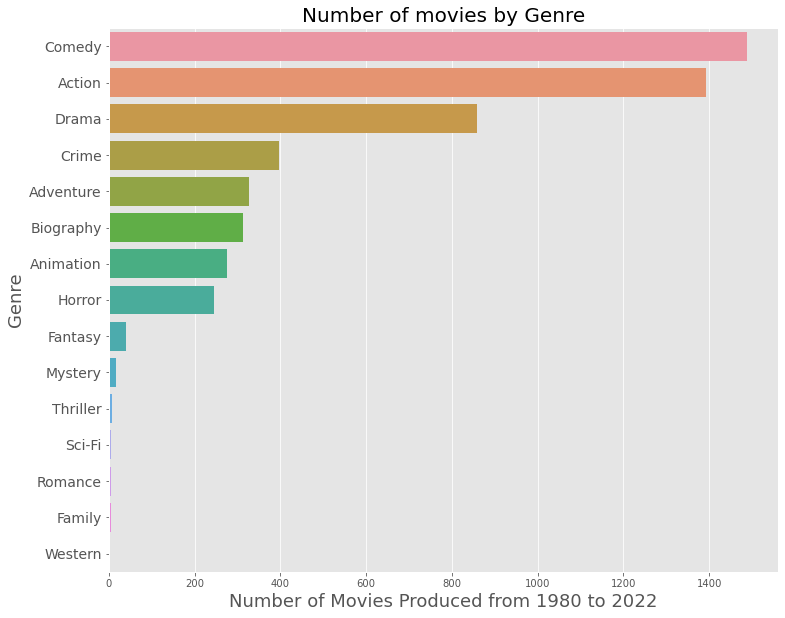

In [19]:
plt.figure(figsize=(12,10))

sns.barplot(x = 'number of movies', y = 'genre', data = df_genre )
plt.title("Number of movies by Genre", fontsize=20)
plt.xlabel("Number of Movies Produced from 1980 to 2022", fontsize=18)
plt.ylabel("Genre", fontsize=18)
plt.yticks(fontsize=14)
plt.show()

In [20]:
# Countries with the highest amount of movie release
df_country = df.groupby(by='country', as_index=False).agg({'name': pd.Series.nunique})
#df_country = df_genre.sort_values(by=['name'], ascending=False)
df_country.rename(columns = {'name':'number of releases'}, inplace = True)
df_country = df_country.sort_values(by=['number of releases'], ascending=False)
df_countries = df_country.head(10)
df_countries

,country,number of releases
47,United States,4267
46,United Kingdom,491
6,Canada,111
14,France,105
15,Germany,82
2,Australia,42
26,Japan,28
8,China,26
16,Hong Kong,24
22,Ireland,21


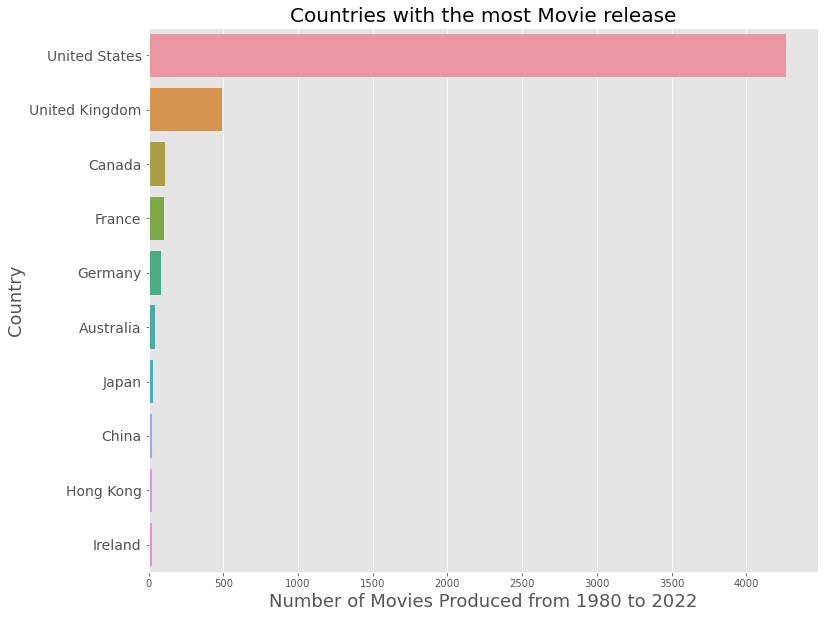

In [21]:
plt.figure(figsize=(12,10))

sns.barplot(x = 'number of releases', y = 'country', data = df_countries )
plt.title("Countries with the most Movie release", fontsize=20)
plt.xlabel("Number of Movies Produced from 1980 to 2022", fontsize=18)
plt.ylabel("Country", fontsize=18)
plt.yticks(fontsize=14)
plt.show()

The United States has produced more movies than any all other countries combined

In [22]:
#Top grossing movie
pd.set_option("display.max_rows", None) #this code is to help show the whole dataset without limitation
#sort by "gross"
df.sort_values(by=['gross'], inplace=False, ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,month,day,week_day,revenue
5445,Avatar,PG-13,Action,2009,2009-12-18,7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,12,18,4,2610246203
7445,Avengers: Endgame,PG-13,Action,2019,2019-04-26,8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,4,26,4,2441501328
3045,Titanic,PG-13,Drama,1997,1997-12-19,7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,12,19,4,2001647264
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,2015-12-18,7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,12,18,4,1824521700
7244,Avengers: Infinity War,PG-13,Action,2018,2018-04-27,8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,4,27,4,1727359754
7480,The Lion King,PG,Animation,2019,2019-07-19,6.9,222000.0,Jon Favreau,Jeff Nathanson,Donald Glover,United States,260000000,1670727580,Walt Disney Pictures,118.0,7,19,4,1410727580
6653,Jurassic World,PG-13,Action,2015,2015-06-12,7.0,593000.0,Colin Trevorrow,Rick Jaffa,Chris Pratt,United States,150000000,1670516444,Universal Pictures,124.0,6,12,4,1520516444
6043,The Avengers,PG-13,Action,2012,2012-05-04,8.0,1300000.0,Joss Whedon,Joss Whedon,Robert Downey Jr.,United States,220000000,1518815515,Marvel Studios,143.0,5,4,4,1298815515
6646,Furious 7,PG-13,Action,2015,2015-04-03,7.1,370000.0,James Wan,Chris Morgan,Vin Diesel,United States,190000000,1515341399,Universal Pictures,137.0,4,3,4,1325341399
7494,Frozen II,PG,Animation,2019,2019-11-22,6.8,148000.0,Chris Buck,Jennifer Lee,Kristen Bell,United States,150000000,1450026933,Walt Disney Animation Studios,103.0,11,22,4,1300026933


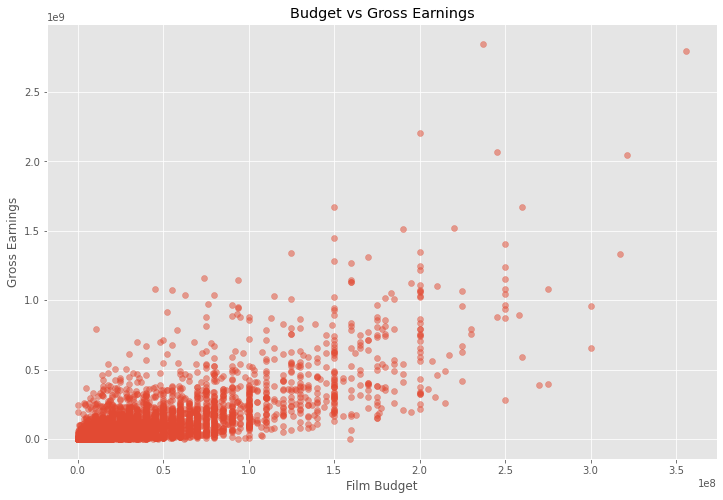

In [23]:
#scatter plot of Budget vs Gross Earnings
plt.scatter(x=df['budget'], y=df['gross'], alpha=0.5)
plt.title('Budget vs Gross Earnings')
plt.xlabel('Film Budget')
plt.ylabel('Gross Earnings')
plt.show()

<AxesSubplot:xlabel='budget', ylabel='gross'>

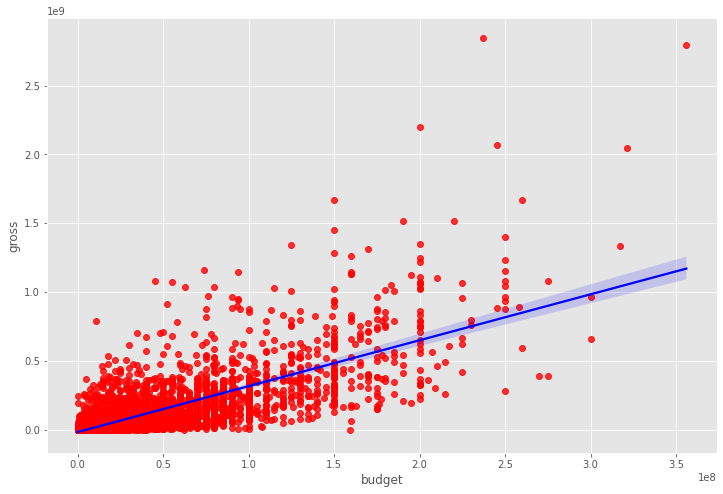

In [24]:
sns.regplot(x='budget',y='gross', data=df, scatter_kws={"color": "red"}, line_kws={"color": "blue"})

# Correlation

In [25]:
correlation = df.corr(method='pearson')
correlation


,year,score,votes,budget,gross,runtime,month,day,week_day,revenue
year,1.000000,0.056506,0.206161,0.327961,0.274395,0.075094,-0.025348,0.012812,-0.011032,0.237480
score,0.056506,1.000000,0.474349,0.072155,0.222709,0.414173,0.050786,-0.014487,-0.045088,0.243482
votes,0.206161,0.474349,1.000000,0.439757,0.614808,0.352350,0.058711,-0.018588,-0.068625,0.609250
budget,0.327961,0.072155,0.439757,1.000000,0.740263,0.318706,0.065815,-0.003851,-0.049742,0.610545
gross,0.274395,0.222709,0.614808,0.740263,1.000000,0.275849,0.057916,-0.010120,-0.063875,0.984427
runtime,0.075094,0.414173,0.352350,0.318706,0.275849,1.000000,0.074586,0.009199,-0.059966,0.241612
month,-0.025348,0.050786,0.058711,0.065815,0.057916,0.074586,1.000000,-0.004158,-0.141007,0.051015
day,0.012812,-0.014487,-0.018588,-0.003851,-0.010120,0.009199,-0.004158,1.000000,-0.050957,-0.010914
week_day,-0.011032,-0.045088,-0.068625,-0.049742,-0.063875,-0.059966,-0.141007,-0.050957,1.000000,-0.062238
revenue,0.237480,0.243482,0.609250,0.610545,0.984427,0.241612,0.051015,-0.010914,-0.062238,1.000000


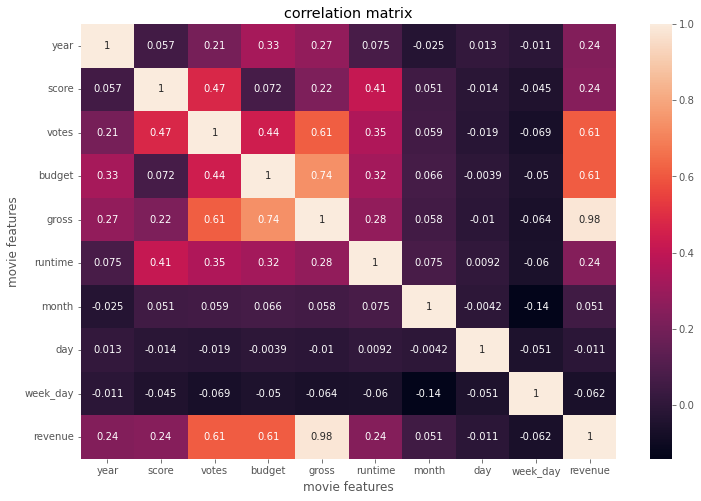

In [26]:
#heatmap is created to view correlations
sns.heatmap(correlation, annot=True)

plt.title('correlation matrix')
plt.xlabel('movie features')
plt.ylabel('movie features')
plt.show()

#as we can see there is correlation between 'gross' & 'budget'

In [27]:
df_numbered = df

In [28]:
#give all the character columns unique numberic values so they can be used in the correlation matrix
for col_name in df_numbered.columns:
    if(df_numbered[col_name].dtype == 'object'):
        df_numbered[col_name]= df_numbered[col_name].astype('category')
        df_numbered[col_name] = df_numbered[col_name].cat.codes
        
df_numbered


,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,month,day,week_day,revenue
0,4695,6,6,1980,1980-06-13,8.4,927000.0,1797,2834,699,46,19000000,46998772,1426,146.0,6,13,4,27998772
1,3932,6,1,1980,1980-07-02,5.8,65000.0,1579,1159,214,47,4500000,58853106,452,104.0,7,2,2,54353106
2,3643,4,0,1980,1980-06-20,8.7,1200000.0,757,1819,1157,47,18000000,538375067,945,124.0,6,20,4,520375067
3,204,4,4,1980,1980-07-02,7.7,221000.0,889,1414,1474,47,3500000,83453539,1108,88.0,7,2,2,79953539
4,732,6,4,1980,1980-07-25,7.3,108000.0,719,352,271,47,6000000,39846344,1083,98.0,7,25,4,33846344
5,1509,6,9,1980,1980-05-09,6.4,123000.0,1760,3083,155,47,550000,39754601,1108,95.0,5,9,4,39204601
6,3933,6,0,1980,1980-06-20,7.9,188000.0,974,577,860,47,27000000,115229890,1397,133.0,6,20,4,88229890
7,3124,6,3,1980,1980-12-19,8.2,330000.0,1270,1258,1469,47,18000000,23402427,390,129.0,12,19,4,5402427
8,3734,4,0,1980,1981-06-19,6.8,101000.0,1608,1403,595,47,54000000,108185706,548,127.0,6,19,4,54185706
9,4404,6,3,1980,1980-05-16,7.0,10000.0,2013,281,402,47,10000000,15795189,1391,100.0,5,16,4,5795189


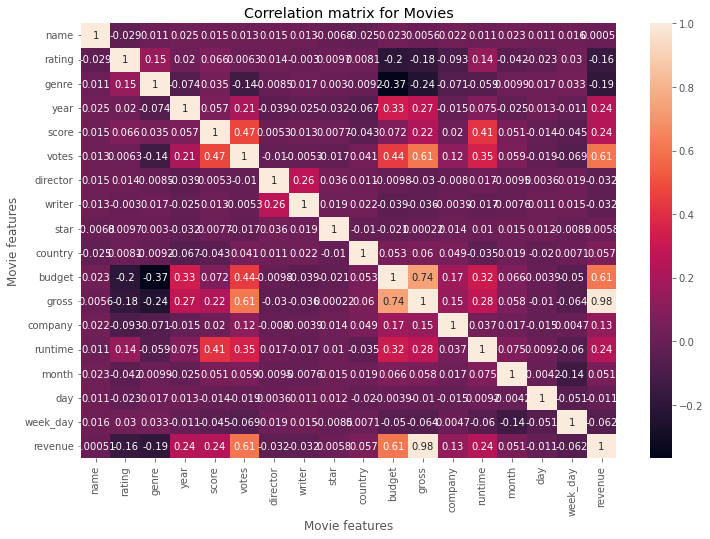

In [29]:
correlation_matrix = df_numbered.corr(method='pearson')

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation matrix for Movies")

plt.xlabel("Movie features")

plt.ylabel("Movie features")

plt.show()


In [30]:
#It looks like Action movies always make the biggest profit but in fact, producers tended to do more comedies. 
#Perhaps making the comedies requires less budget?
# Average budget for making comedies & action movies
print('Average budget for making comedies: ',df[df.genre=='Comedy']['budget'].mean())
print('Average budget for making action movies: ',df[df.genre=='Action']['budget'].mean())

Average budget for making comedies:  nan
Average budget for making action movies:  nan


This shows that comedies are cheaper to make hence why they are made alot

In [31]:
#Let's see the percentage of profitable movies by genre:
action=df.loc[df['genre']=='Action']
per_act_pro=round(100*action.loc[action['revenue']>0].size/action.size,1,)
print('Percentage of profitable action movies: ',per_act_pro,'%')

com=df.loc[df['genre']=='Comedy']
per_com_pro=round(100*com.loc[com['revenue']>0].size/com.size,1,)
print('Percentage of profitable comedies: ',per_com_pro,'%')

dra=df.loc[df['genre']=='Drama']
per_dra_pro=round(100*dra.loc[dra['revenue']>0].size/dra.size,1,)
print('Percentage of profitable dramas: ',per_dra_pro,'%')

cri=df.loc[df['genre']=='Crime']
per_cri_pro=round(100*cri.loc[cri['revenue']>0].size/cri.size,1,)
print('Percentage of profitable crime movies: ',per_cri_pro,'%')

adv=df.loc[df['genre']=='Adventure']
per_adv_pro=round(100*adv.loc[adv['revenue']>0].size/adv.size,1,)
print('Percentage of profitable adventure movies: ',per_adv_pro,'%')

bio=df.loc[df['genre']=='Biography']
per_bio_pro=round(100*bio.loc[bio['revenue']>0].size/bio.size,1,)
print('Percentage of profitable biography movies: ',per_bio_pro,'%')

ani=df.loc[df['genre']=='Animation']
per_ani_pro=round(100*ani.loc[ani['revenue']>0].size/ani.size,1,)
print('Percentage of profitable animation movies: ',per_ani_pro,'%')

hor=df.loc[df['genre']=='Horror']
per_hor_pro=round(100*hor.loc[hor['revenue']>0].size/hor.size,1,)
print('Percentage of profitable dramas: ',per_hor_pro,'%')

fan=df.loc[df['genre']=='Fantasy']
per_fan_pro=round(100*fan.loc[fan['revenue']>0].size/fan.size,1,)
print('Percentage of profitable fantasy movies: ',per_fan_pro,'%')

mys=df.loc[df['genre']=='Mystery']
per_mys_pro=round(100*mys.loc[mys['revenue']>0].size/mys.size,1,)
print('Percentage of profitable mystery movies: ',per_mys_pro,'%')

thri=df.loc[df['genre']=='Thriller']
per_thri_pro=round(100*thri.loc[thri['revenue']>0].size/thri.size,1,)
print('Percentage of profitable mystery thrillers: ',per_thri_pro,'%')

sci=df.loc[df['genre']=='Sci-Fi']
per_sci_pro=round(100*sci.loc[sci['revenue']>0].size/sci.size,1,)
print('Percentage of profitable Sci-Fi movies: ',per_sci_pro,'%')

rom=df.loc[df['genre']=='Romance']
per_rom_pro=round(100*rom.loc[rom['revenue']>0].size/rom.size,1,)
print('Percentage of profitable romance movies: ',per_rom_pro,'%')

fam=df.loc[df['genre']=='Family']
per_fam_pro=round(100*fam.loc[fam['revenue']>0].size/fam.size,1,)
print('Percentage of profitable family movies: ',per_fam_pro,'%')

west=df.loc[df['genre']=='Western']
per_west_pro=round(100*west.loc[west['revenue']>0].size/west.size,1,)
print('Percentage of profitable western movies: ',per_west_pro,'%')

Percentage of profitable action movies:  nan %
Percentage of profitable comedies:  nan %
Percentage of profitable dramas:  nan %
Percentage of profitable crime movies:  nan %
Percentage of profitable adventure movies:  nan %
Percentage of profitable biography movies:  nan %
Percentage of profitable animation movies:  nan %
Percentage of profitable dramas:  nan %
Percentage of profitable fantasy movies:  nan %
Percentage of profitable mystery movies:  nan %
Percentage of profitable mystery thrillers:  nan %
Percentage of profitable Sci-Fi movies:  nan %
Percentage of profitable romance movies:  nan %
Percentage of profitable family movies:  nan %
Percentage of profitable western movies:  nan %


C:\Users\UCHECH~1\AppData\Local\Temp/ipykernel_18988/2871700381.py:3: RuntimeWarning: invalid value encountered in long_scalars
  per_act_pro=round(100*action.loc[action['revenue']>0].size/action.size,1,)
C:\Users\UCHECH~1\AppData\Local\Temp/ipykernel_18988/2871700381.py:7: RuntimeWarning: invalid value encountered in long_scalars
  per_com_pro=round(100*com.loc[com['revenue']>0].size/com.size,1,)
C:\Users\UCHECH~1\AppData\Local\Temp/ipykernel_18988/2871700381.py:11: RuntimeWarning: invalid value encountered in long_scalars
  per_dra_pro=round(100*dra.loc[dra['revenue']>0].size/dra.size,1,)
C:\Users\UCHECH~1\AppData\Local\Temp/ipykernel_18988/2871700381.py:15: RuntimeWarning: invalid value encountered in long_scalars
  per_cri_pro=round(100*cri.loc[cri['revenue']>0].size/cri.size,1,)
C:\Users\UCHECH~1\AppData\Local\Temp/ipykernel_18988/2871700381.py:19: RuntimeWarning: invalid value encountered in long_scalars
  per_adv_pro=round(100*adv.loc[adv['revenue']>0].size/adv.size,1,)
C:\Users

The least profitable movies are Sci-Fi & the most profitable genre is drama